In [5]:
# ===== CELL 1: Installs =====
!apt-get -qq update > /dev/null 2>&1
!echo "ttf-mscorefonts-installer msttcorefonts/accepted-mscorefonts-eula select true" | debconf-set-selections
!apt-get -qq install -y ttf-mscorefonts-installer > /dev/null 2>&1
!fc-cache -f > /dev/null 2>&1

# Verify it actually landed on disk (this is the part that silently fails sometimes)
!fc-list | grep -i "times new roman" || echo "NOT FOUND - will need Runtime > Restart session and rerun"

/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman.ttf: Times New Roman:style=Regular,Normal,obyčejné,Standard,Κανονικά,Normaali,Normál,Normale,Standaard,Normalny,Обычный,Normálne,Navadno,thường,Arrunta
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Italic.ttf: Times New Roman:style=Italic,cursiva,kurzíva,kursiv,Πλάγια,Kursivoitu,Italique,Dőlt,Corsivo,Cursief,kursywa,Itálico,Курсив,İtalik,Poševno,nghiêng,Etzana
/usr/share/fonts/truetype/msttcorefonts/timesbd.ttf: Times New Roman:style=Bold,Negreta,tučné,fed,Fett,Έντονα,Negrita,Lihavoitu,Gras,Félkövér,Grassetto,Vet,Halvfet,Pogrubiona,Negrito,Полужирный,Fet,Kalın,Krepko,đậm,Lodia
/usr/share/fonts/truetype/msttcorefonts/Times_New_Roman_Bold_Italic.ttf: Times New Roman:style=Bold Italic,Negreta cursiva,tučné kurzíva,fed kursiv,Fett Kursiv,Έντονα Πλάγια,Negrita Cursiva,Lihavoitu Kursivoi,Gras Italique,Félkövér dőlt,Grassetto Corsivo,Vet Cursief,Halvfet Kursiv,Pogrubiona kursywa,Negrito Itálico,Полужирный Курсив,Tučná kurzíva

In [6]:
!wget -q -O /content/TimesNewRoman.ttf https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf
!wget -q -O /content/times.ttf https://github.com/FSKiller/Microsoft-Fonts/raw/main/times.ttf
!wget -q -O /content/timesbd.ttf https://github.com/FSKiller/Microsoft-Fonts/raw/main/timesbd.ttf

In [7]:
# ===== CELL 2: Imports, font config, plot/save configuration =====
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron as SkPerceptron
from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                              f1_score, confusion_matrix)

# Rebuild matplotlib's font cache so it picks up the just-installed font
for f in os.listdir(matplotlib.get_cachedir()):
    if 'fontlist' in f:
        os.remove(os.path.join(matplotlib.get_cachedir(), f))
fm.fontManager = fm.FontManager()

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman'] + plt.rcParams['font.serif']
plt.rcParams['savefig.dpi'] = 600
plt.rcParams['figure.dpi'] = 600
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13

PLOT_DIR = "/content/plots"
os.makedirs(PLOT_DIR, exist_ok=True)

def save_plot(fig, name):
    path = os.path.join(PLOT_DIR, f"{name}.eps")
    fig.savefig(path, format='eps', dpi=600, bbox_inches='tight')
    print(f"Saved: {path}")

used_font = fm.FontProperties(family='serif').get_name() if False else None
print("Configured font.serif priority:", plt.rcParams['font.serif'][:3])

Configured font.serif priority: ['Times New Roman', 'Times New Roman', 'DejaVu Serif']


In [8]:
# ===== CELL 3: Task 1 - Load dataset =====
DATA_PATH = "/content/data_banknote_authentication.txt"

df = pd.read_csv(DATA_PATH, header=None,
                  names=['Variance', 'Skewness', 'Curtosis', 'Entropy', 'Class'])
print(df.shape)
df.head()

(1372, 5)


,Variance,Skewness,Curtosis,Entropy,Class
0,3.62160,8.6661,-2.8073,-0.44699,0
1,4.54590,8.1674,-2.4586,-1.46210,0
2,3.86600,-2.6383,1.9242,0.10645,0
3,3.45660,9.5228,-4.0112,-3.59440,0
4,0.32924,-4.4552,4.5718,-0.98880,0


In [9]:
# ===== CELL 4: Task 1 - Dataset exploration =====
print("First 5 samples:\n", df.head(), "\n")
print("Dataset dimensions:", df.shape, "\n")
print("Missing values:\n", df.isnull().sum(), "\n")
print("Descriptive statistics:\n", df.describe(), "\n")
print("Class distribution:\n", df['Class'].value_counts())

First 5 samples:
    Variance  Skewness  Curtosis  Entropy  Class
0   3.62160    8.6661   -2.8073 -0.44699      0
1   4.54590    8.1674   -2.4586 -1.46210      0
2   3.86600   -2.6383    1.9242  0.10645      0
3   3.45660    9.5228   -4.0112 -3.59440      0
4   0.32924   -4.4552    4.5718 -0.98880      0 

Dataset dimensions: (1372, 5) 

Missing values:
 Variance    0
Skewness    0
Curtosis    0
Entropy     0
Class       0
dtype: int64 

Descriptive statistics:
           Variance     Skewness     Curtosis      Entropy        Class
count  1372.000000  1372.000000  1372.000000  1372.000000  1372.000000
mean      0.433735     1.922353     1.397627    -1.191657     0.444606
std       2.842763     5.869047     4.310030     2.101013     0.497103
min      -7.042100   -13.773100    -5.286100    -8.548200     0.000000
25%      -1.773000    -1.708200    -1.574975    -2.413450     0.000000
50%       0.496180     2.319650     0.616630    -0.586650     0.000000
75%       2.821475     6.814625     

Saved: /content/plots/feature_histograms.eps


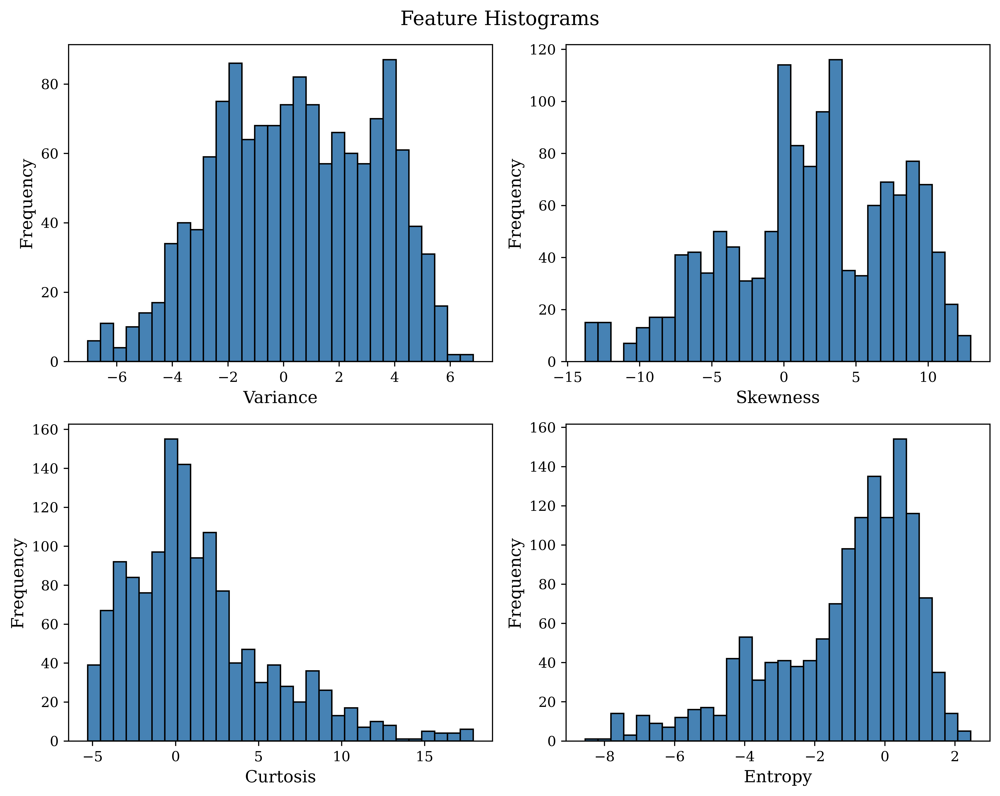

Saved: /content/plots/correlation_heatmap.eps


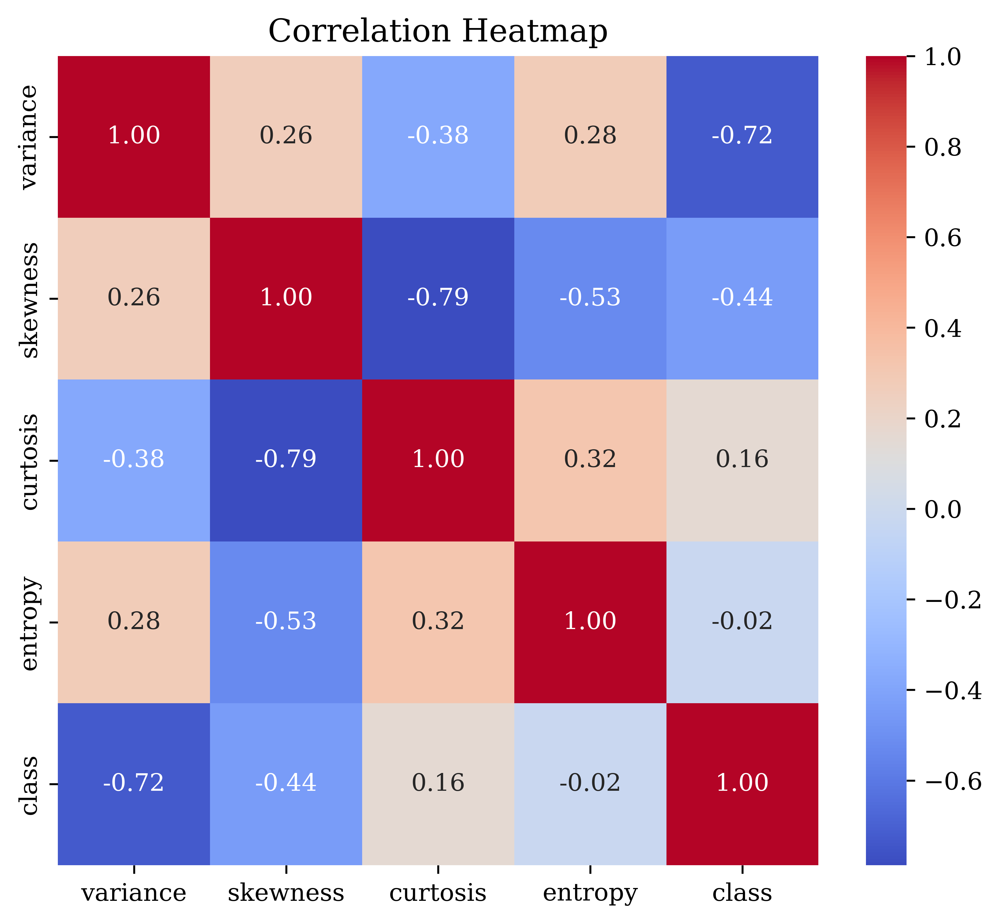

Saved: /content/plots/pairwise_scatter_plot.eps


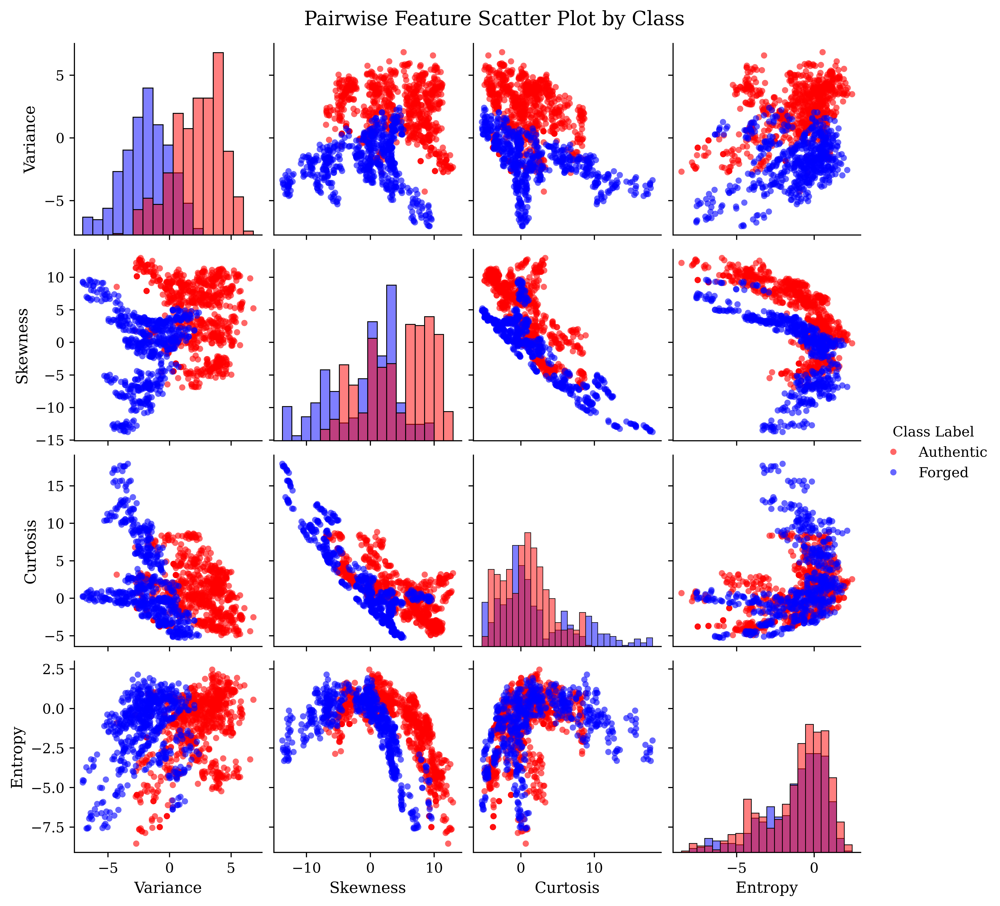

Saved: /content/plots/boxplots.eps


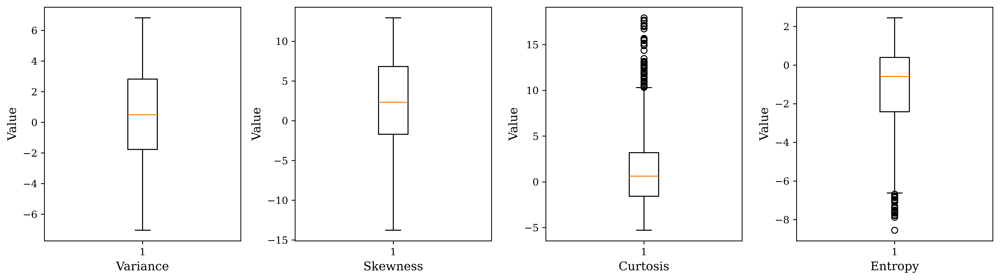

In [10]:
# ===== CELL 5: Task 2 - Exploratory Data Analysis =====
features = ['Variance', 'Skewness', 'Curtosis', 'Entropy']

# --- Histograms ---
fig, axes = plt.subplots(2, 2, figsize=(10, 8))
for ax, col in zip(axes.flatten(), features):
    ax.hist(df[col], bins=30, color='steelblue', edgecolor='black')
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel('Frequency', fontsize=12)
fig.suptitle('Feature Histograms', fontsize=14)
plt.tight_layout()
save_plot(fig, "feature_histograms")
plt.show()


# --- Correlation Heatmap (including class) ---
corr_features = features + ['Class']
fig, ax = plt.subplots(figsize=(7, 6))
corr = df[corr_features].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', ax=ax,
            xticklabels=[c.lower() for c in corr_features],
            yticklabels=[c.lower() for c in corr_features])
ax.set_title('Correlation Heatmap', fontsize=13)
save_plot(fig, "correlation_heatmap")
plt.show()

# --- Pairwise Scatter Plot Matrix ---
df_plot = df.copy()
df_plot['Class Label'] = df_plot['Class'].map({0: 'Authentic', 1: 'Forged'})

g = sns.pairplot(
    df_plot,
    vars=features,
    hue='Class Label',
    palette={'Authentic': 'red', 'Forged': 'blue'},
    diag_kind='hist',
    plot_kws={'alpha': 0.6, 's': 20, 'edgecolor': 'none'},
    diag_kws={'edgecolor': 'black'},
    height=2.2
)
g.fig.suptitle('Pairwise Feature Scatter Plot by Class', fontsize=14, y=1.02)
for ax in g.axes.flatten():
    if ax is not None:
        ax.set_xlabel(ax.get_xlabel(), fontsize=11)
        ax.set_ylabel(ax.get_ylabel(), fontsize=11)
save_plot(g.fig, "pairwise_scatter_plot")
plt.show()

# --- Boxplots ---
fig, axes = plt.subplots(1, 4, figsize=(14, 4))
for ax, col in zip(axes, features):
    ax.boxplot(df[col])
    ax.set_xlabel(col, fontsize=12)
    ax.set_ylabel('Value', fontsize=12)
plt.tight_layout()
save_plot(fig, "boxplots")
plt.show()

In [11]:
# ===== CELL 6: Task 3 - Preprocessing =====
X_raw = df[features].values
y_raw = df['Class'].values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)

X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_raw, test_size=0.2, random_state=42, stratify=y_raw
)
print("Train size:", X_train.shape, "Test size:", X_test.shape)

Train size: (1097, 4) Test size: (275, 4)


In [12]:
# ===== CELL 7: Task 4 - Perceptron Implementation =====
class Perceptron:
    def __init__(self, n_features, learning_rate=0.01, n_epochs=50, random_state=42):
        rng = np.random.default_rng(random_state)
        self.w = rng.normal(0, 0.01, n_features)
        self.b = 0.0
        self.lr = learning_rate
        self.n_epochs = n_epochs
        self.history = {'epoch': [], 'errors': [], 'weights': [], 'bias': []}

    @staticmethod
    def step_activation(z):
        return np.where(z >= 0, 1, 0)

    def forward(self, X):
        z = X @ self.w + self.b
        return self.step_activation(z)

    def fit(self, X, y, verbose=True):
        for epoch in range(1, self.n_epochs + 1):
            errors = 0
            for xi, target in zip(X, y):
                z = np.dot(xi, self.w) + self.b
                y_hat = self.step_activation(z)
                update = self.lr * (target - y_hat)
                if update != 0.0:
                    self.w += update * xi
                    self.b += update
                    errors += 1
            self.history['epoch'].append(epoch)
            self.history['errors'].append(errors)
            self.history['weights'].append(self.w.copy())
            self.history['bias'].append(self.b)
            if verbose:
                print(f"Epoch {epoch:3d} | Misclassified: {errors:3d} | "
                      f"w1={self.w[0]:.4f} w2={self.w[1]:.4f} | b={self.b:.4f}")
            if errors == 0:
                break
        return self

    def predict(self, X):
        return self.forward(X)

In [13]:
# ===== CELL 8: Task 5 - Model Training =====
LR = 0.01
model = Perceptron(n_features=X_train.shape[1], learning_rate=LR, n_epochs=50)
model.fit(X_train, y_train)

Epoch   1 | Misclassified:  51 | w1=-0.0626 w2=-0.0793 | b=-0.0300
Epoch   2 | Misclassified:  24 | w1=-0.0762 w2=-0.1023 | b=-0.0300
Epoch   3 | Misclassified:  23 | w1=-0.0780 w2=-0.0965 | b=-0.0400
Epoch   4 | Misclassified:  32 | w1=-0.0886 w2=-0.1127 | b=-0.0600
Epoch   5 | Misclassified:  26 | w1=-0.0967 w2=-0.1214 | b=-0.0600
Epoch   6 | Misclassified:  20 | w1=-0.1096 w2=-0.1347 | b=-0.0400
Epoch   7 | Misclassified:  23 | w1=-0.1161 w2=-0.1428 | b=-0.0500
Epoch   8 | Misclassified:  20 | w1=-0.1059 w2=-0.1432 | b=-0.0700
Epoch   9 | Misclassified:  23 | w1=-0.1249 w2=-0.1533 | b=-0.0600
Epoch  10 | Misclassified:  18 | w1=-0.1199 w2=-0.1608 | b=-0.0600
Epoch  11 | Misclassified:  17 | w1=-0.1248 w2=-0.1561 | b=-0.0700
Epoch  12 | Misclassified:  18 | w1=-0.1243 w2=-0.1548 | b=-0.0700
Epoch  13 | Misclassified:  19 | w1=-0.1280 w2=-0.1594 | b=-0.0800
Epoch  14 | Misclassified:  14 | w1=-0.1379 w2=-0.1736 | b=-0.0600
Epoch  15 | Misclassified:  21 | w1=-0.1439 w2=-0.1819 | b=-0.

Saved: /content/plots/training_error_vs_epoch.eps


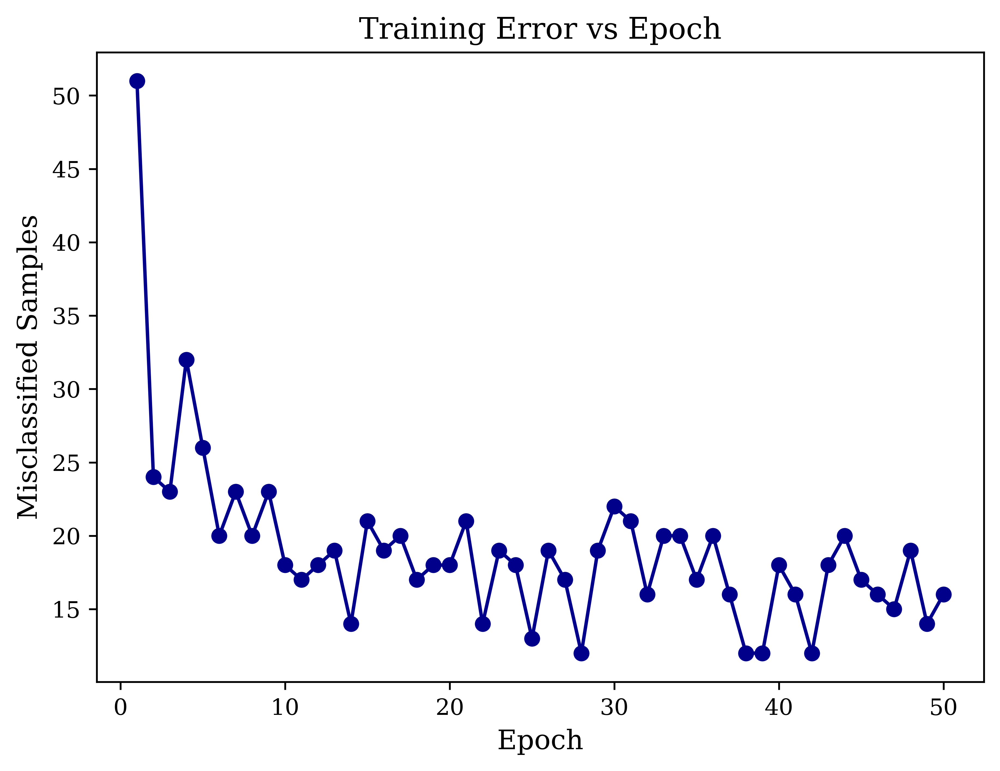

Saved: /content/plots/weight_evolution.eps


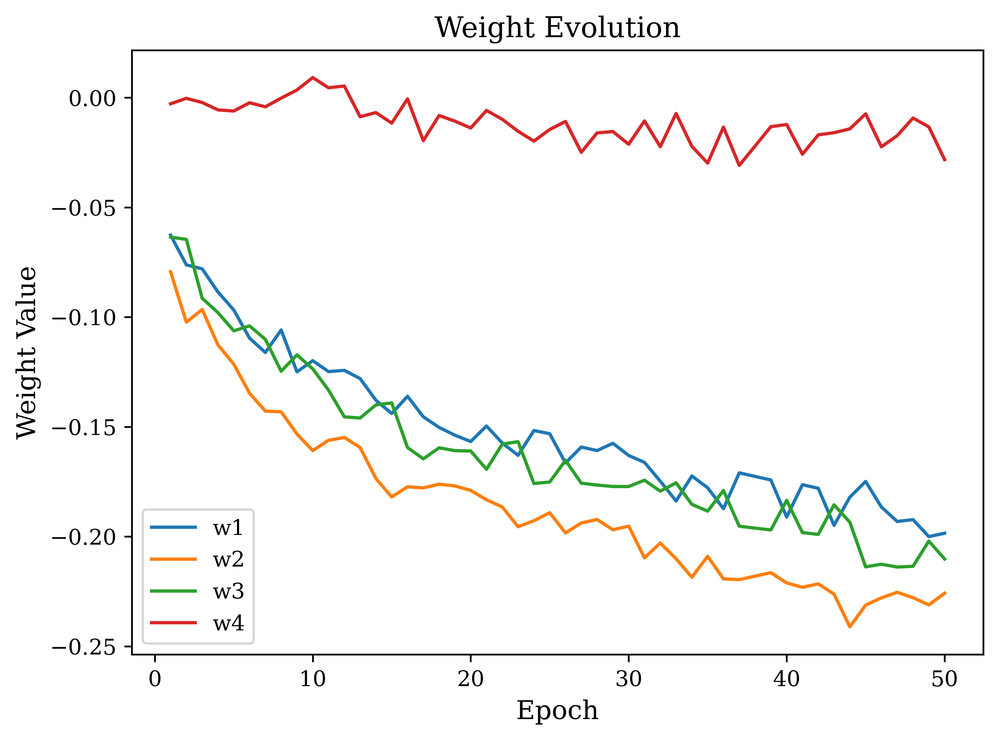

Saved: /content/plots/bias_evolution.eps


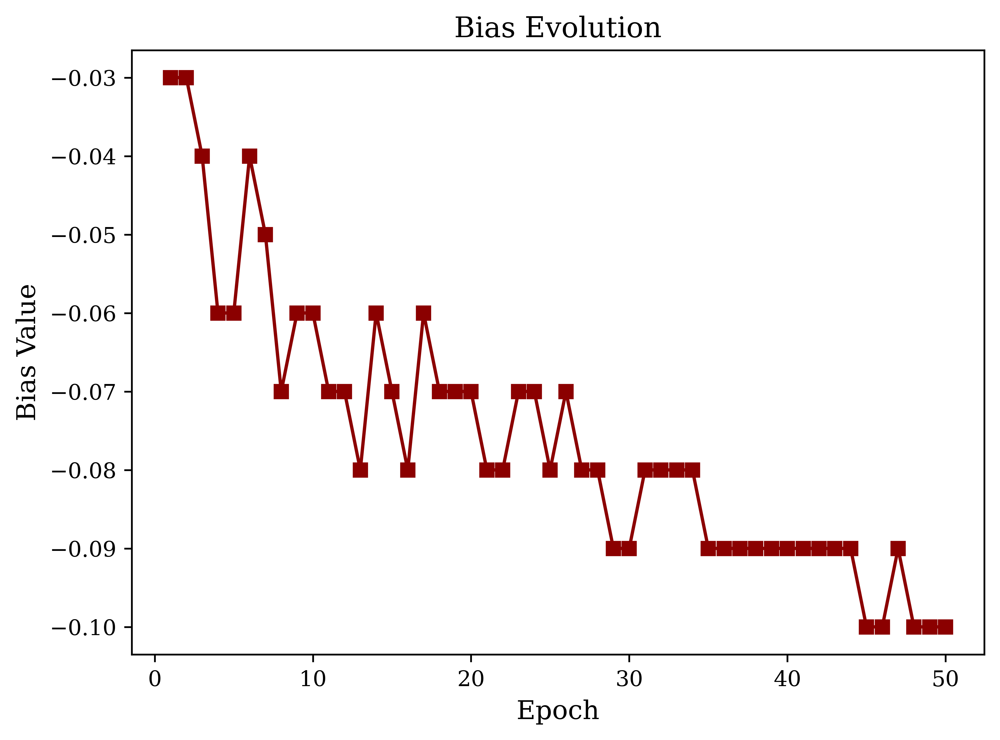

In [14]:
# ===== CELL 9: Plots - Training Error, Weight Evolution, Bias Evolution =====
epochs = model.history['epoch']
errors = model.history['errors']
weights = np.array(model.history['weights'])
biases = model.history['bias']

fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(epochs, errors, marker='o', color='darkblue')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Misclassified Samples', fontsize=12)
ax.set_title('Training Error vs Epoch', fontsize=13)
save_plot(fig, "training_error_vs_epoch")
plt.show()

fig, ax = plt.subplots(figsize=(7, 5))
for i in range(weights.shape[1]):
    ax.plot(epochs, weights[:, i], label=f'w{i+1}')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Weight Value', fontsize=12)
ax.set_title('Weight Evolution', fontsize=13)
ax.legend()
save_plot(fig, "weight_evolution")
plt.show()

fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(epochs, biases, color='darkred', marker='s')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Bias Value', fontsize=12)
ax.set_title('Bias Evolution', fontsize=13)
save_plot(fig, "bias_evolution")
plt.show()

Accuracy : 0.9891
Precision: 0.9837
Recall   : 0.9918
F1-score : 0.9878
Confusion Matrix:
 [[151   2]
 [  1 121]]
Saved: /content/plots/confusion_matrix.eps


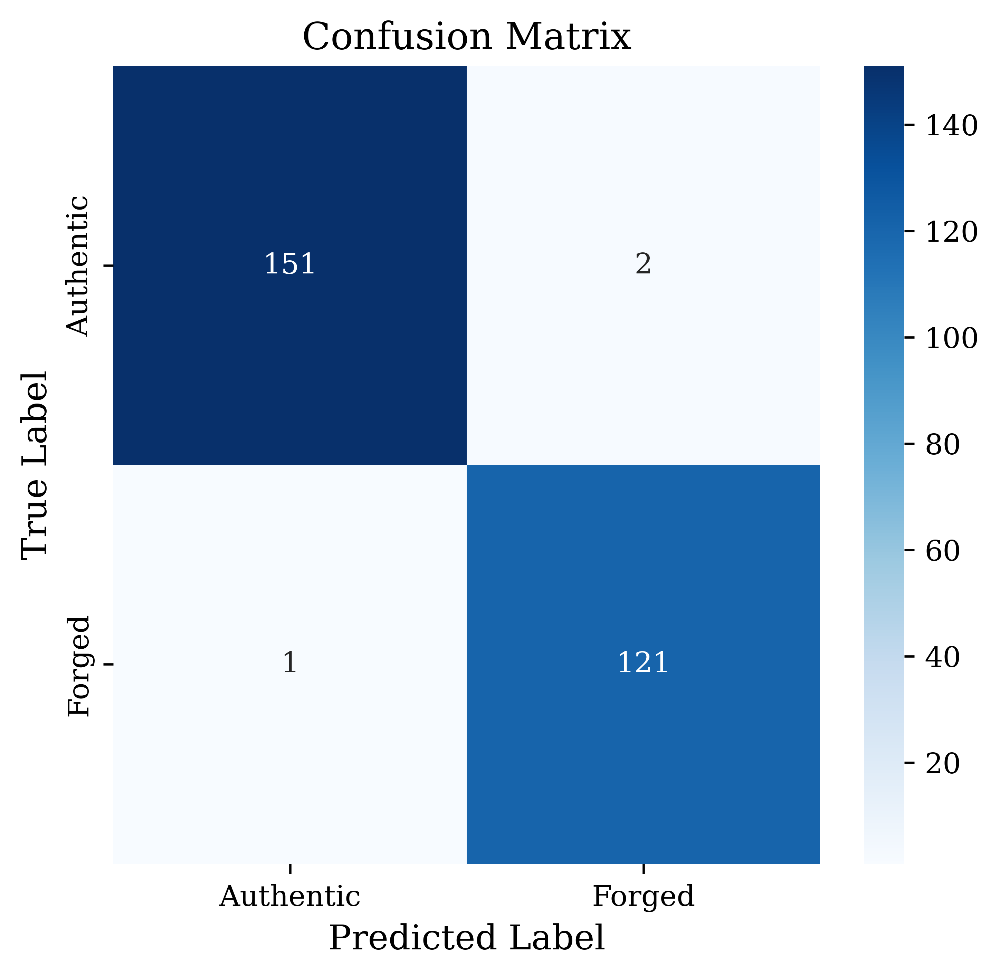

In [15]:
# ===== CELL 10: Task 6 - Model Evaluation =====
y_pred = model.predict(X_test)

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred)

print(f"Accuracy : {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall   : {rec:.4f}")
print(f"F1-score : {f1:.4f}")
print("Confusion Matrix:\n", cm)

fig, ax = plt.subplots(figsize=(5.5, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Authentic', 'Forged'], yticklabels=['Authentic', 'Forged'], ax=ax)
ax.set_xlabel('Predicted Label', fontsize=12)
ax.set_ylabel('True Label', fontsize=12)
ax.set_title('Confusion Matrix', fontsize=13)
save_plot(fig, "confusion_matrix")
plt.show()

Saved: /content/plots/learning_rate_comparison.eps


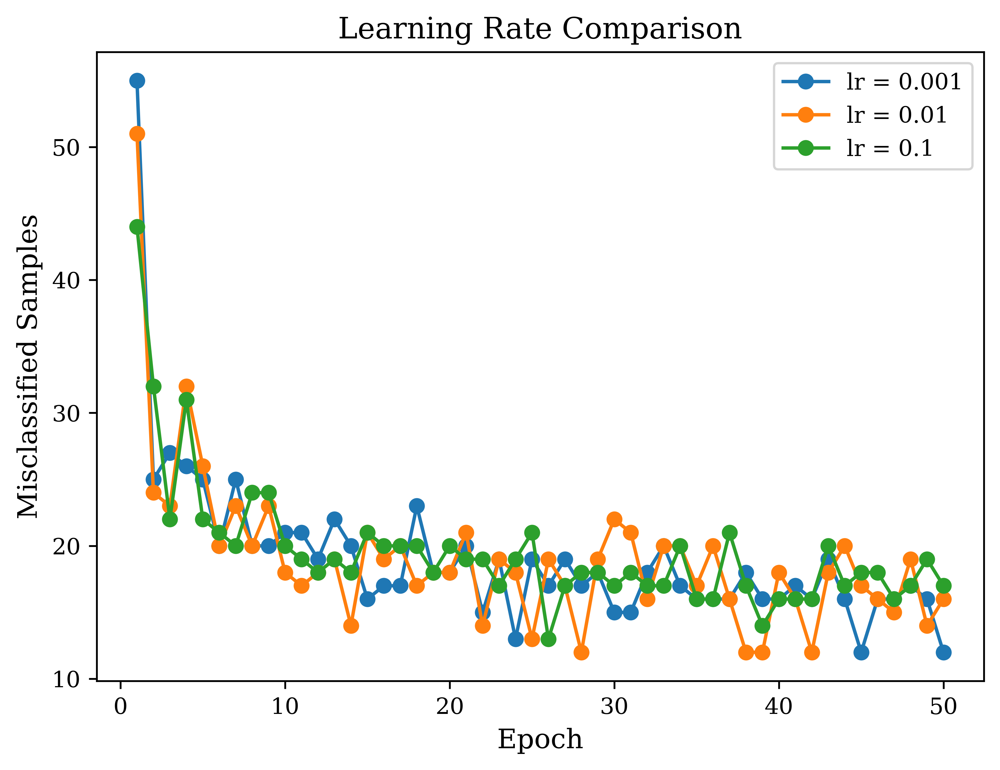

In [16]:
# ===== CELL 11: Additional Task 3 - Learning Rate Comparison =====
learning_rates = [0.001, 0.01, 0.1]
lr_histories = {}

for lr in learning_rates:
    m = Perceptron(n_features=X_train.shape[1], learning_rate=lr, n_epochs=50)
    m.fit(X_train, y_train, verbose=False)
    lr_histories[lr] = m.history

fig, ax = plt.subplots(figsize=(7, 5))
for lr, hist in lr_histories.items():
    ax.plot(hist['epoch'], hist['errors'], marker='o', label=f'lr = {lr}')
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Misclassified Samples', fontsize=12)
ax.set_title('Learning Rate Comparison', fontsize=13)
ax.legend()
save_plot(fig, "learning_rate_comparison")
plt.show()

Saved: /content/plots/decision_boundary.eps


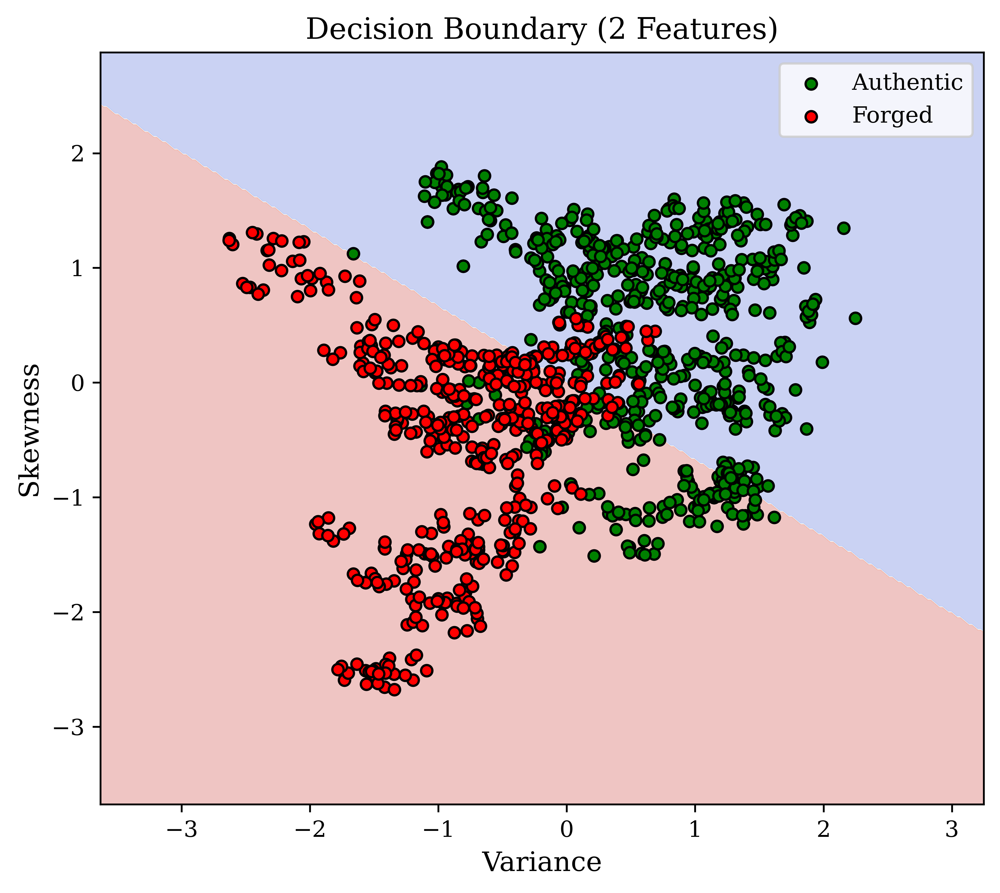

Custom Perceptron  -> Accuracy: 0.9891
Sklearn Perceptron -> Accuracy: 0.9745


In [17]:
# ===== CELL 12: Decision Boundary (Optional) + Sklearn Comparison =====
X2 = X_scaled[:, :2]
X2_train, X2_test, y2_train, y2_test = train_test_split(
    X2, y_raw, test_size=0.2, random_state=42, stratify=y_raw)

m2 = Perceptron(n_features=2, learning_rate=0.01, n_epochs=50)
m2.fit(X2_train, y2_train, verbose=False)

xx, yy = np.meshgrid(np.linspace(X2[:,0].min()-1, X2[:,0].max()+1, 300),
                      np.linspace(X2[:,1].min()-1, X2[:,1].max()+1, 300))
Z = m2.predict(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(7, 6))
ax.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')
for cls, color, label in zip([0, 1], ['green', 'red'], ['Authentic', 'Forged']):
    idx = y2_train == cls
    ax.scatter(X2_train[idx, 0], X2_train[idx, 1], c=color, label=label, edgecolor='k', s=25)
ax.set_xlabel('Variance', fontsize=12)
ax.set_ylabel('Skewness', fontsize=12)
ax.set_title('Decision Boundary (2 Features)', fontsize=13)
ax.legend()
save_plot(fig, "decision_boundary")
plt.show()

sk_model = SkPerceptron(max_iter=50, eta0=0.01, random_state=42)
sk_model.fit(X_train, y_train)
sk_pred = sk_model.predict(X_test)

print("Custom Perceptron  -> Accuracy: {:.4f}".format(acc))
print("Sklearn Perceptron -> Accuracy: {:.4f}".format(accuracy_score(y_test, sk_pred)))

Saved: /content/plots/step_vs_sigmoid.eps


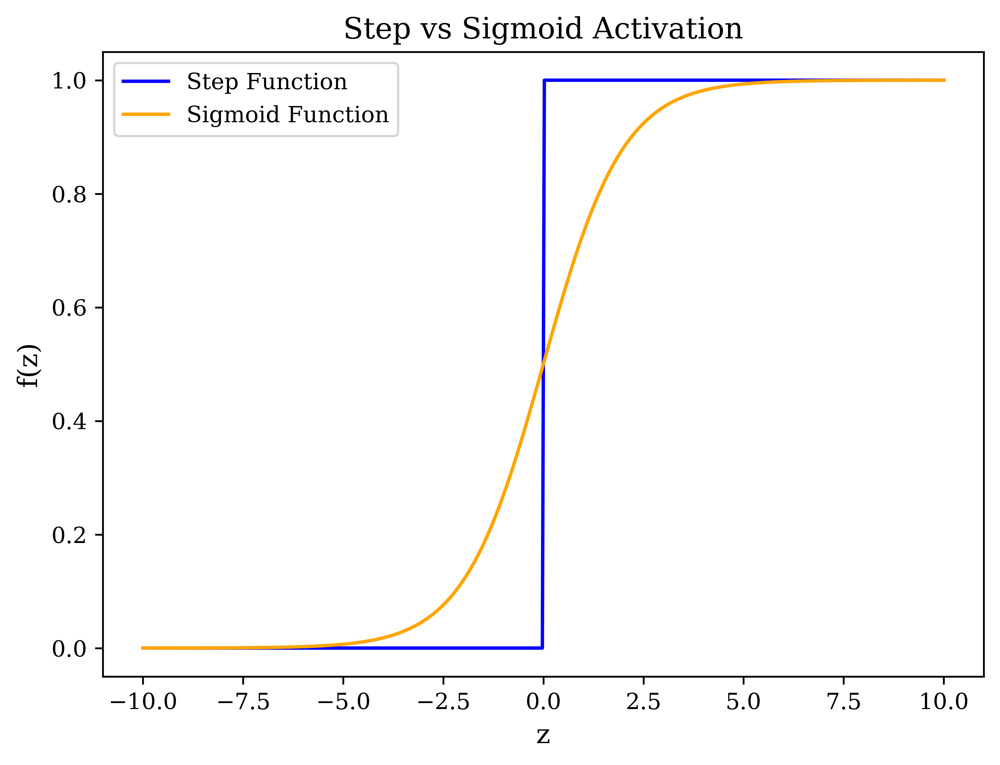


Discussion: The Step function is non-differentiable at z=0 and has zero gradient
elsewhere, making it unusable with gradient-based backpropagation. Sigmoid is smooth
and differentiable everywhere, allowing gradients to propagate through deep networks.

XOR predictions: [1 0 0 0]  | True: [0 1 1 0]
A single-layer perceptron cannot solve XOR because XOR is not linearly separable; no single straight line can separate the two classes in 2D input space.


In [18]:
# ===== CELL 13: Additional Tasks 1 & 4 =====
z = np.linspace(-10, 10, 400)
step = (z >= 0).astype(int)
sigmoid = 1 / (1 + np.exp(-z))

fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(z, step, label='Step Function', color='blue')
ax.plot(z, sigmoid, label='Sigmoid Function', color='orange')
ax.set_xlabel('z', fontsize=12)
ax.set_ylabel('f(z)', fontsize=12)
ax.set_title('Step vs Sigmoid Activation', fontsize=13)
ax.legend()
save_plot(fig, "step_vs_sigmoid")
plt.show()

print("""
Discussion: The Step function is non-differentiable at z=0 and has zero gradient
elsewhere, making it unusable with gradient-based backpropagation. Sigmoid is smooth
and differentiable everywhere, allowing gradients to propagate through deep networks.
""")

X_xor = np.array([[0,0],[0,1],[1,0],[1,1]])
y_xor = np.array([0,1,1,0])
xor_model = Perceptron(n_features=2, learning_rate=0.1, n_epochs=20)
xor_model.fit(X_xor, y_xor, verbose=False)
xor_pred = xor_model.predict(X_xor)
print("XOR predictions:", xor_pred, " | True:", y_xor)
print("A single-layer perceptron cannot solve XOR because XOR is not linearly separable;",
      "no single straight line can separate the two classes in 2D input space.")

In [19]:
# ===== CELL 14: Performance Tables =====
summary = pd.DataFrame({
    "Metric": ["Dataset Size", "Train/Test Split", "Learning Rate", "Epochs Run",
               "Final Weights", "Final Bias", "Accuracy", "Precision", "Recall", "F1-score"],
    "Value": [len(df), "80/20", LR, len(epochs),
              np.round(model.w, 4).tolist(), round(model.b, 4),
              round(acc, 4), round(prec, 4), round(rec, 4), round(f1, 4)]
})
print(summary.to_string(index=False))

epoch_table = pd.DataFrame({
    "Epoch": epochs,
    "Errors": errors,
    "Weight1": weights[:,0].round(4),
    "Weight2": weights[:,1].round(4),
    "Weight3": weights[:,2].round(4),
    "Weight4": weights[:,3].round(4),
    "Bias": np.round(biases, 4)
})
print("\nEpoch-wise Learning Table:\n", epoch_table.to_string(index=False))

          Metric                                Value
    Dataset Size                                 1372
Train/Test Split                                80/20
   Learning Rate                                 0.01
      Epochs Run                                   50
   Final Weights [-0.1985, -0.2258, -0.2102, -0.0282]
      Final Bias                                 -0.1
        Accuracy                               0.9891
       Precision                               0.9837
          Recall                               0.9918
        F1-score                               0.9878

Epoch-wise Learning Table:
  Epoch  Errors  Weight1  Weight2  Weight3  Weight4  Bias
     1      51  -0.0626  -0.0793  -0.0635  -0.0028 -0.03
     2      24  -0.0762  -0.1023  -0.0646  -0.0003 -0.03
     3      23  -0.0780  -0.0965  -0.0914  -0.0022 -0.04
     4      32  -0.0886  -0.1127  -0.0980  -0.0056 -0.06
     5      26  -0.0967  -0.1214  -0.1062  -0.0061 -0.06
     6      20  -0.1096  -0.1347  -

In [20]:
# ===== CELL 15: Zip and download all plots =====
import shutil
from google.colab import files

zip_path = "/content/experiment1_plots"
shutil.make_archive(zip_path, 'zip', PLOT_DIR)

print("Files in archive:")
for f in os.listdir(PLOT_DIR):
    print(" -", f)

files.download(zip_path + ".zip")

Files in archive:
 - step_vs_sigmoid.eps
 - weight_evolution.eps
 - correlation_heatmap.eps
 - feature_histograms.eps
 - decision_boundary.eps
 - bias_evolution.eps
 - boxplots.eps
 - training_error_vs_epoch.eps
 - pairwise_scatter_plot.eps
 - learning_rate_comparison.eps
 - confusion_matrix.eps


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>